In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform #NEED TO CHECK IF WE CAN USE IT

## Load Data

In [2]:
fma_data = 'fma_metadata/'
#1 Gb heavy files
features = pd.read_csv(fma_data +'features.csv') # the pandas dataframe with the features and labels

C:\Users\patrik\AppData\Local\conda\conda\envs\ntds_2018\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,2

In [3]:
tracks = pd.read_csv(fma_data +'tracks.csv')
genres = pd.read_csv(fma_data +'genres.csv')
echonest = pd.read_csv(fma_data + "echonest.csv")

C:\Users\patrik\AppData\Local\conda\conda\envs\ntds_2018\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (0,1,5,6,8,12,18,20,21,22,24,33,34,38,39,44,47,49) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\patrik\AppData\Local\conda\conda\envs\ntds_2018\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,11,13,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,1

## Cleaning

### rock-hiphop tracks

In [4]:
t = tracks.copy()
t.columns = t.iloc[0]
t.drop(t.index[0], inplace=True)
t.drop(t.index[0], inplace=True)
t = t.rename(columns={np.NaN: 'track_id'})
t = t.set_index('track_id')
t = t[t['genres'] != '[]']
t = t[['title', 'genres', 'genres_all', 'genre_top', 'id', 'name',]]
pd.io.parsers.ParserBase({'title':t.columns})._maybe_dedup_names(t.columns)
t = t.rename(columns={ t.columns[0]: 'album_title', t.columns[1] : 'track_title', t.columns[5] : 'album_id', t.columns[6] : 'artist_id'})
rh = t.loc[(t['genre_top'] == 'Hip-Hop') | (t['genre_top'] == 'Rock') ]
rh.head(5)

,track_title,track_title,genres,genres_all,genre_top,artist_id,artist_id,name
track_id,,,,,,,,
2,AWOL - A Way Of Life,Food,[21],[21],Hip-Hop,1,1,AWOL
3,AWOL - A Way Of Life,Electric Ave,[21],[21],Hip-Hop,1,1,AWOL
5,AWOL - A Way Of Life,This World,[21],[21],Hip-Hop,1,1,AWOL
134,AWOL - A Way Of Life,Street Music,[21],[21],Hip-Hop,1,1,AWOL
135,mp3,Father's Day,"[45, 58]","[58, 12, 45]",Rock,58,52,Abominog


### features tracks

In [5]:
f = features.iloc[3:,1:].copy()
features_id_list = features.iloc[3:,:]['feature'].rename('track_id')
len(features_id_list), len(f)

(106574, 106574)

In [6]:
f = f.apply(lambda x : pd.to_numeric(x))
f = (f - f.mean())/f.std() #normalize data 
f.set_index(features_id_list, inplace=True)
f.head(5)

,chroma_cens,chroma_cens.1,chroma_cens.2,chroma_cens.3,chroma_cens.4,chroma_cens.5,chroma_cens.6,chroma_cens.7,chroma_cens.8,chroma_cens.9,...,tonnetz.39,tonnetz.40,tonnetz.41,zcr,zcr.1,zcr.2,zcr.3,zcr.4,zcr.5,zcr.6
track_id,,,,,,,,,,,,,,,,,,,,,
2,0.208783,0.452351,-0.008553,0.056481,0.079043,0.017718,0.071164,0.152168,0.090291,0.129121,...,-1.200554,-1.537649,-1.595035,-0.266430,0.425839,1.007357,0.874126,-0.454601,-0.369211,0.775695
3,0.044880,0.050426,0.001063,0.106159,0.090461,-0.020371,0.064405,0.046439,-0.012742,0.040800,...,-0.938944,-1.210800,-0.675909,-0.299408,0.463110,0.975153,0.643104,-0.454601,-0.491742,1.064848
5,0.002712,-0.024945,-0.061548,0.021789,0.109331,0.046419,-0.070494,-0.081501,0.063099,0.092097,...,-1.561597,-1.461119,-1.162616,-0.254635,-0.034719,0.011006,-0.065367,-0.454601,-0.335247,0.167181
10,0.101044,-0.044147,0.186566,-0.026460,0.071382,0.056075,0.088194,0.081984,0.043355,0.207548,...,-0.655210,-0.595294,-1.299385,-0.090254,0.385907,0.758695,0.889528,-0.454601,0.107731,0.018234
20,-0.019632,-0.035814,-0.013339,-0.000614,0.031972,-0.018958,-0.033153,-0.074345,-0.021467,-0.133377,...,-0.098755,0.151931,-0.085645,-0.143811,0.481745,-0.169453,-0.111571,-0.265063,-0.008018,-0.341556


### merge tracks and features

In [7]:
features_and_tracks = pd.merge(f, rh, left_index=True, right_index=True)
features_and_tracks.head(5)

,chroma_cens,chroma_cens.1,chroma_cens.2,chroma_cens.3,chroma_cens.4,chroma_cens.5,chroma_cens.6,chroma_cens.7,chroma_cens.8,chroma_cens.9,...,zcr.5,zcr.6,track_title,track_title,genres,genres_all,genre_top,artist_id,artist_id,name
track_id,,,,,,,,,,,,,,,,,,,,,
2,0.208783,0.452351,-0.008553,0.056481,0.079043,0.017718,0.071164,0.152168,0.090291,0.129121,...,-0.369211,0.775695,AWOL - A Way Of Life,Food,[21],[21],Hip-Hop,1,1,AWOL
3,0.044880,0.050426,0.001063,0.106159,0.090461,-0.020371,0.064405,0.046439,-0.012742,0.040800,...,-0.491742,1.064848,AWOL - A Way Of Life,Electric Ave,[21],[21],Hip-Hop,1,1,AWOL
5,0.002712,-0.024945,-0.061548,0.021789,0.109331,0.046419,-0.070494,-0.081501,0.063099,0.092097,...,-0.335247,0.167181,AWOL - A Way Of Life,This World,[21],[21],Hip-Hop,1,1,AWOL
134,0.014819,0.042658,0.024361,0.052995,0.042523,-0.019502,0.054530,-0.032942,0.098250,0.141020,...,-0.462391,0.525310,AWOL - A Way Of Life,Street Music,[21],[21],Hip-Hop,1,1,AWOL
135,0.016676,0.038110,0.079612,-0.068900,-0.094645,-0.028603,-0.067857,-0.080791,-0.128348,0.039583,...,-0.957650,-0.565094,mp3,Father's Day,"[45, 58]","[58, 12, 45]",Rock,58,52,Abominog


In [8]:
np.shape(features_and_tracks)

(14119, 526)

In [9]:
sample = features_and_tracks.sample(frac=0.16)
np.shape(sample)

(2259, 526)

# Features Selection

In [10]:
def select_features(df, indices):
    print('new sample with shape {} created + {} labels'.format(np.shape(df.iloc[:,indices]), np.shape(df.loc[:, 'genre_top'])))
    return df.iloc[:,indices], df.loc[:,'genre_top']

# Compute Adjacency

In [11]:
def compute_cosDist(df):
    A = df.values
    U = A.T/np.linalg.norm(A, axis =1)
    U = U.T
    cosSim = U@U.T
    cosDist = abs(1.0 -cosSim)
    cosDist[cosDist < 1e-10 ] = 0
    return cosDist 

In [12]:
def compute_adjacency(df):
    cosDist = compute_cosDist(df)
    kernel_width = cosDist.mean()
    W = np.exp(-cosDist**2 / kernel_width**2) # the adjacency matrix
    n_nodes = len(W) # the number of nodes in the network
    np.fill_diagonal(W, 0)
    return W

In [13]:
def binary_adjacency(adj, threshold):
    return np.where(adj<threshold, 0, 1)

# Plot Adjacency

In [14]:
def plot_adjacency(adj, xlim = [0, 2000], ylim = [0, 2000]):
    plt.spy(adj, markersize=1)
    plt.title('adjacency matrix')
    plt.xlim(xlim[0], xlim[1])
    plt.ylim(ylim[0], ylim[1])
    plt.show()

### milestone 3 part

In [15]:
from scipy import sparse
import scipy.sparse.linalg
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import collections

In [16]:
def connected_components(L):
    eigNorm = np.linalg.eigh(L)
    norm_vectors = eigNorm[1]
    norm_values = eigNorm[0]

    norm_values = np.where(np.abs(norm_values) < 10e-5 , 0, norm_values)

    CC = len(norm_values[norm_values==0])
    print("There are {} connected components".format(CC))
    return CC

In [17]:
def convert_to_colors(lab):
    colors = np.where(lab=='Rock', 'c', 'k')
    rock = collections.Counter(lab)['Rock']
    hiphop = collections.Counter(lab)['Hip-Hop']
    print('we have {} rock songs and {} hip-hop songs'.format(rock, hiphop))
    return colors

In [18]:
def embed(L, adj):
    CC = connected_components(L)
    d, u = np.linalg.eigh(L)
    if CC + 3 > len(u):
        U = u[:,-2:]
    else:
        U = u[:,CC:CC+2]
    Z = np.matmul(adj, U)
    return Z

In [19]:
def milestone_3(adj, lab):
    
    colors = convert_to_colors(lab)
    
    laplacian_normalized =  sparse.csgraph.laplacian(adj, normed=True)
    out = embed(laplacian_normalized, adj)
    
    kmeans = KMeans(n_clusters = 2)
    kmeansoutput = kmeans.fit(out)
    
    plt.figure(1, figsize=(15,10))
    plt.subplot(221)
    plt.title('kmeans clustering assignment')
    plt.scatter(out[:,0], out[:,1], c=kmeans.labels_)
    plt.subplot(222)
    plt.title('our clustering assignement')
    plt.scatter(out[:,0], out[:,1], c=colors)
    plt.show()

# CHOSING BEST FEATURES

In [20]:
chroma_cens = np.arange(0,84)
chroma_cqt = np.arange(84, 168)
chroma_stft = np.arange(168, 252)
mfcc = np.arange(252, 392)
rmse = np.arange(392, 399)
spectral_bandwidth = np.arange(399, 406)
spectral_centroid = np.arange(406, 413)
spectral_contrast = np.arange(413, 462)
spectral_rolloff = np.arange(462, 469)
tonnetz = np.arange(469, 511)
zcr = np.arange(511, 518)
indices = np.array((chroma_cens, chroma_cqt, chroma_stft, mfcc, rmse, spectral_bandwidth, spectral_centroid\
                   ,spectral_contrast, spectral_rolloff, tonnetz, zcr))

In [21]:
def precision(df, indices):
    for ind in indices:
        temp_features, temp_labels = select_features(df, ind)
        temp_adjacency = compute_adjacency(temp_features)
        milestone_3(temp_adjacency, temp_labels)
def binary_precision(df, indices, threshold):
    print('Threshold = {}'.format(threshold))
    for ind in indices:
        temp_features, temp_labels = select_features(df, ind)
        temp_adjacency = compute_adjacency(temp_features)
        temp_binary_adjacency = binary_adjacency(temp_adjacency, threshold)
        milestone_3(temp_binary_adjacency, temp_labels)

new sample with shape (2259, 84) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


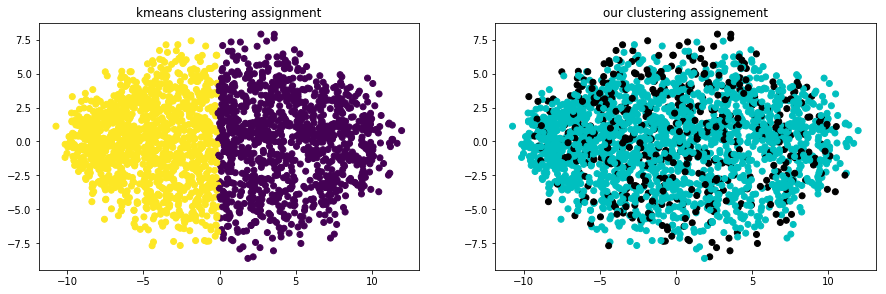

new sample with shape (2259, 84) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


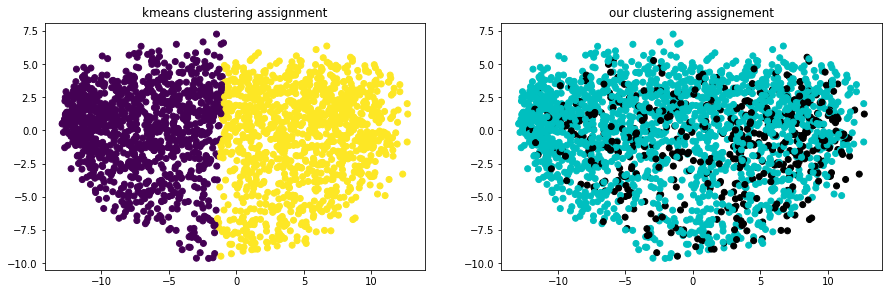

new sample with shape (2259, 84) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


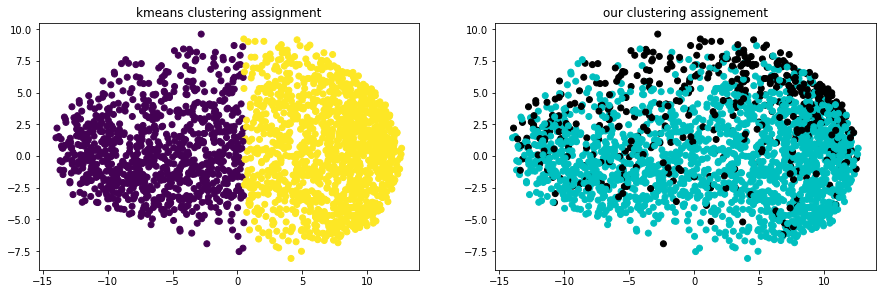

new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


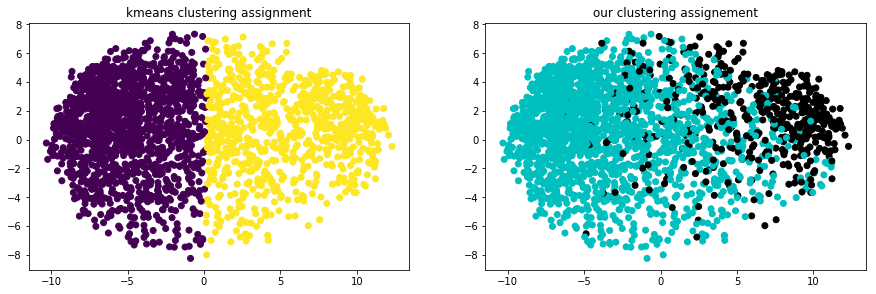

new sample with shape (2259, 7) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


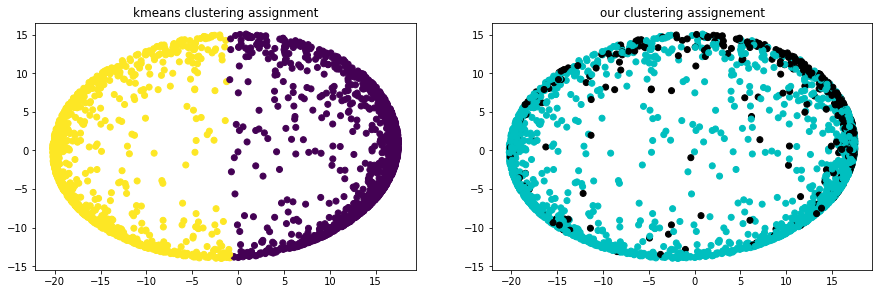

new sample with shape (2259, 7) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


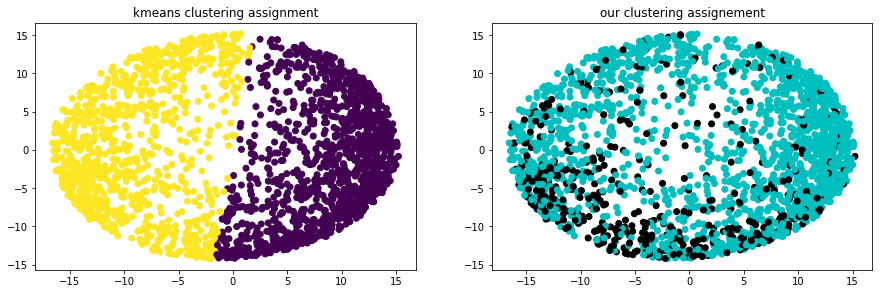

new sample with shape (2259, 7) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


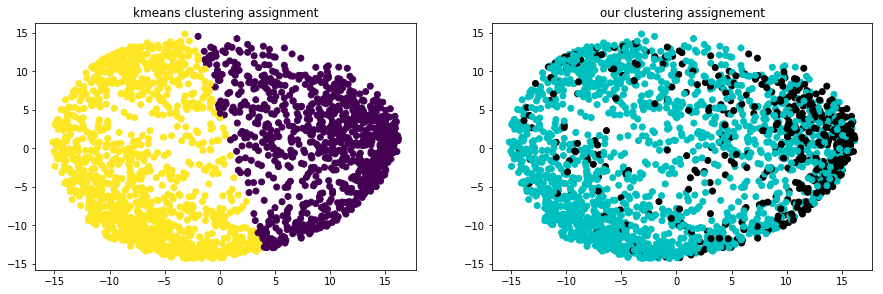

new sample with shape (2259, 49) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


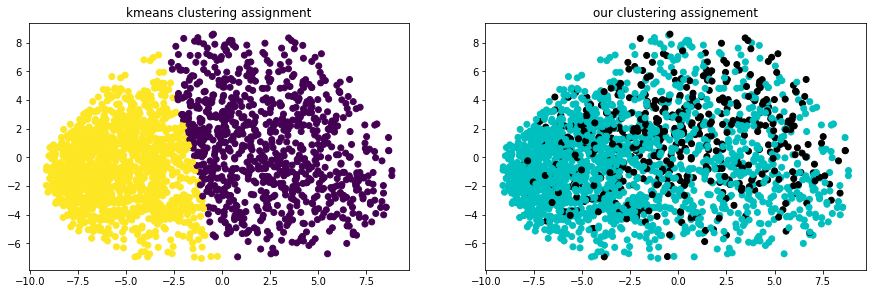

new sample with shape (2259, 7) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


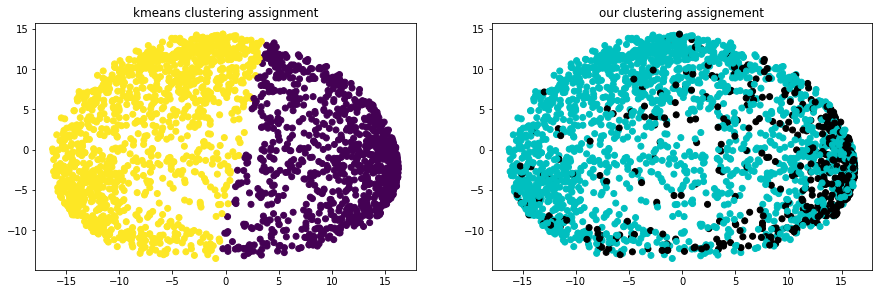

new sample with shape (2259, 42) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


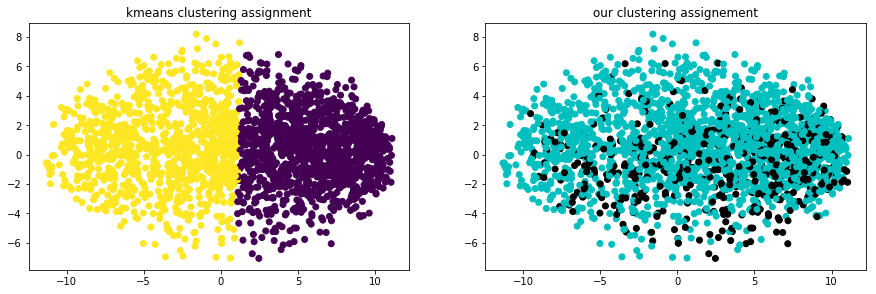

new sample with shape (2259, 7) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


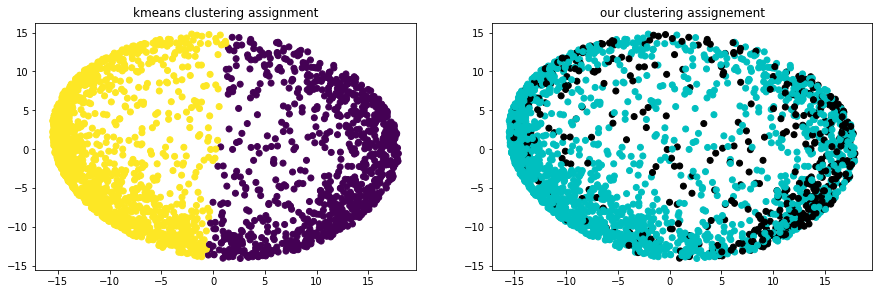

In [22]:
precision(sample, indices)

* we can identify clusters in the plots 3,4,7,9,10 

### Testing a combination of 2 best feature range

new sample with shape (2259, 224) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


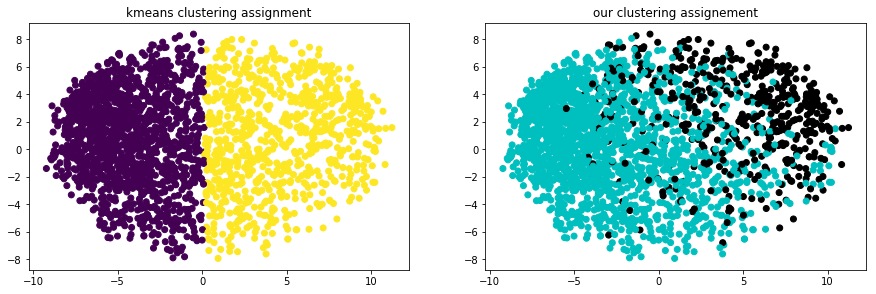

new sample with shape (2259, 91) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


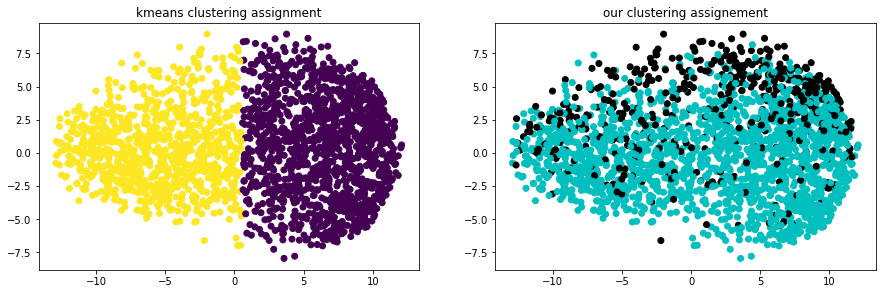

new sample with shape (2259, 91) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


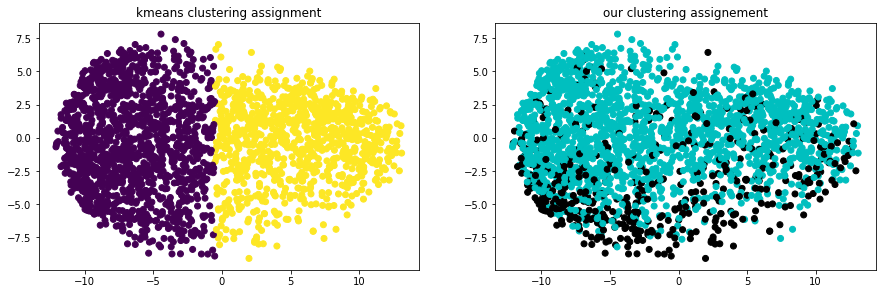

new sample with shape (2259, 126) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


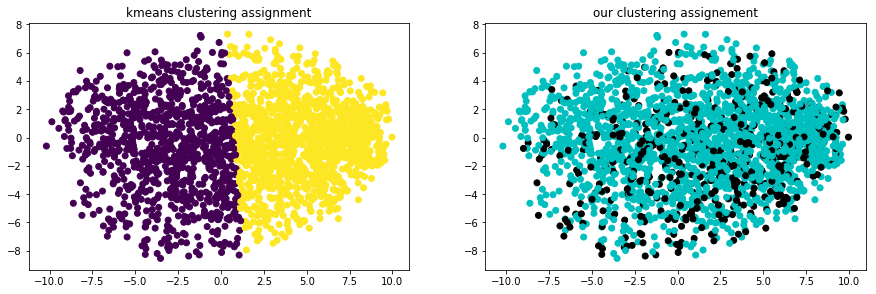

new sample with shape (2259, 147) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


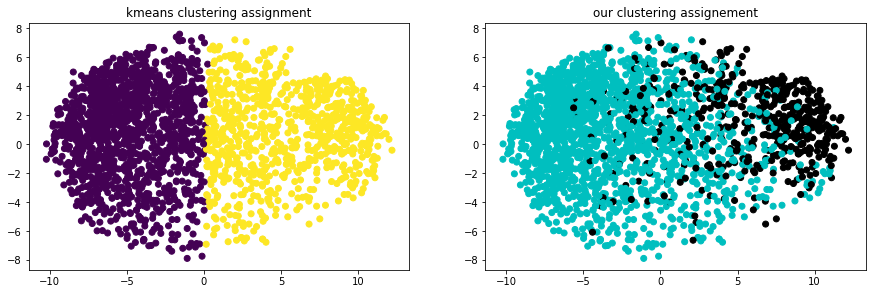

new sample with shape (2259, 147) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


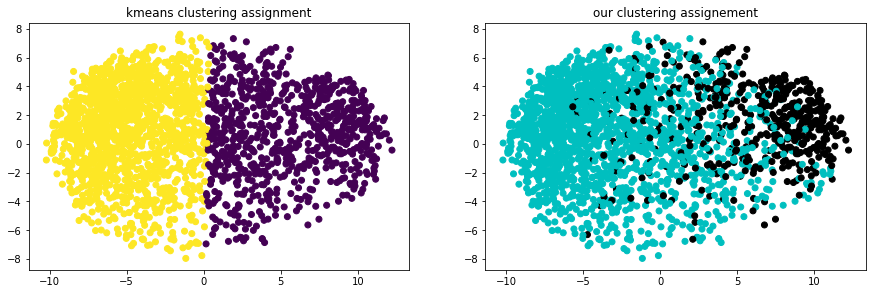

new sample with shape (2259, 182) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


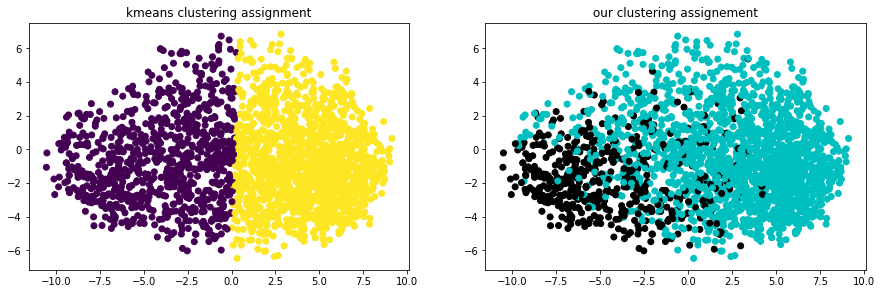

new sample with shape (2259, 14) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


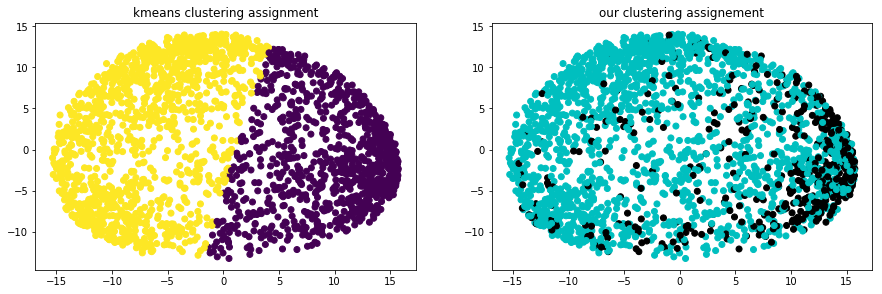

new sample with shape (2259, 49) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


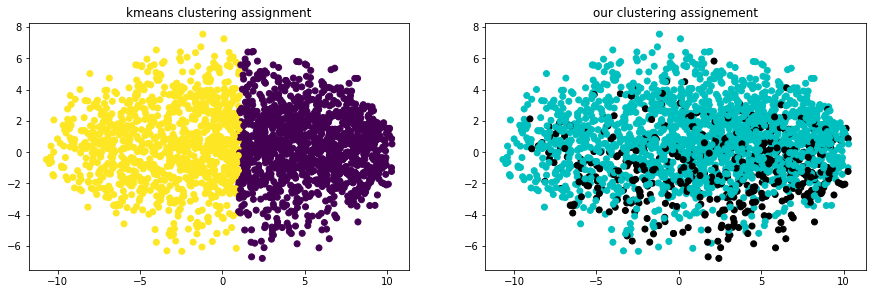

new sample with shape (2259, 49) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


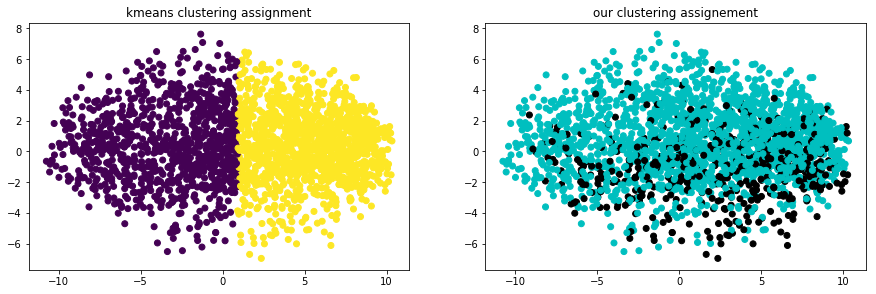

In [23]:
best_indices = [2,3,6,8,9] #-1 for each since its 0-indexed
from itertools import combinations 
comb = []
for i in combinations(best_indices, 2):
    comb.append(np.array(i))
new_indices = [np.concatenate((indices[tup[0]], indices[tup[1]])) for tup in comb]

precision(sample, new_indices)

## Testing all best indices in 1 adjacency

new sample with shape (2259, 280) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


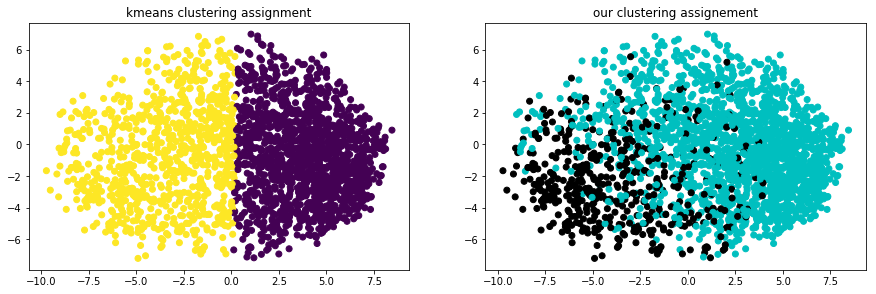

In [24]:
all_best = [indices[ind].tolist() for ind in best_indices]
flat_best = [item for sublist in all_best for item in sublist]
precision(sample, [flat_best])

## testing for the best until now (mfcc)

new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


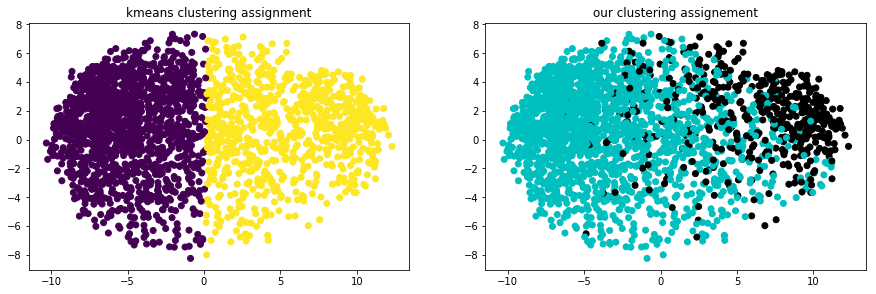

In [25]:
precision(sample, [indices[3]])

# TESTING the threshold for binary adjacency (using mfcc)

Threshold = 0.0
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


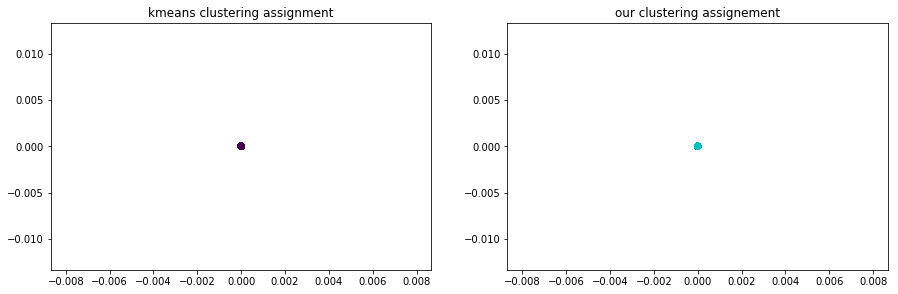

Threshold = 0.07142857142857142
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


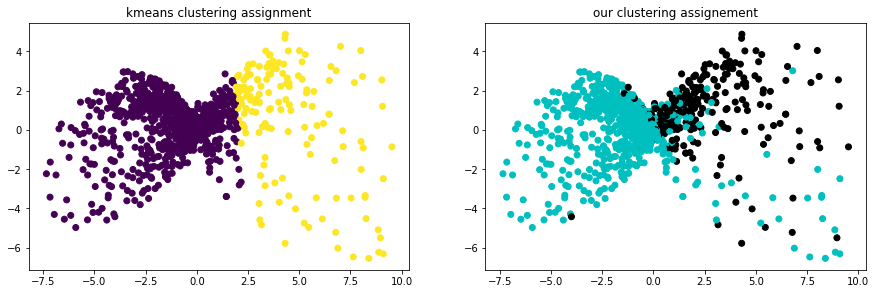

Threshold = 0.14285714285714285
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


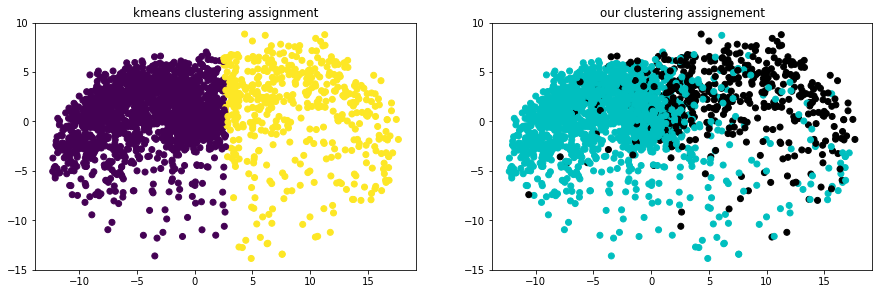

Threshold = 0.21428571428571427
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


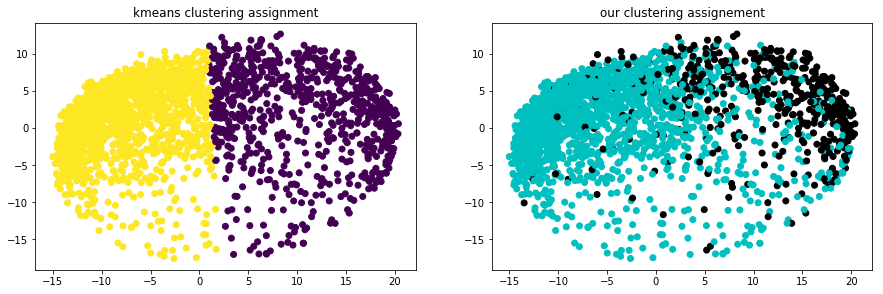

Threshold = 0.2857142857142857
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


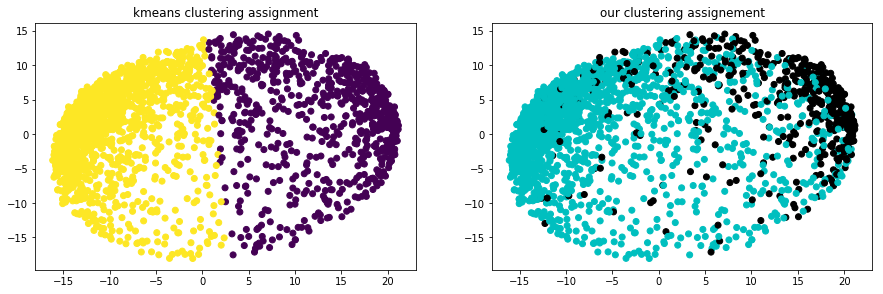

Threshold = 0.3571428571428571
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


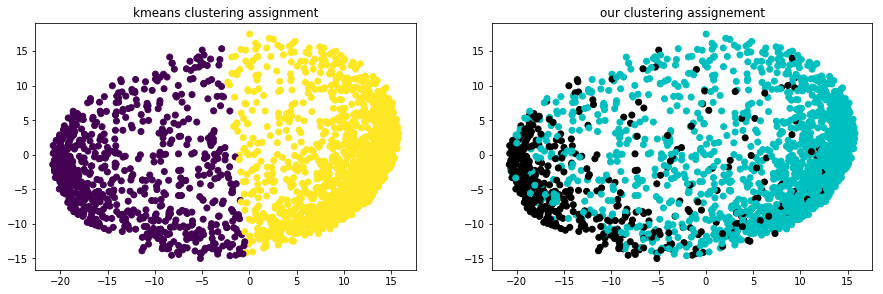

Threshold = 0.42857142857142855
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


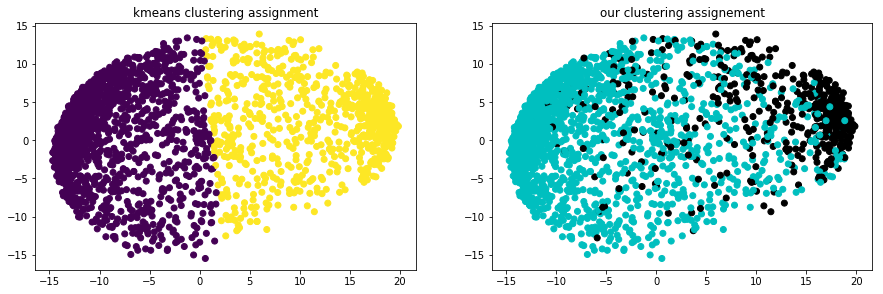

Threshold = 0.5
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


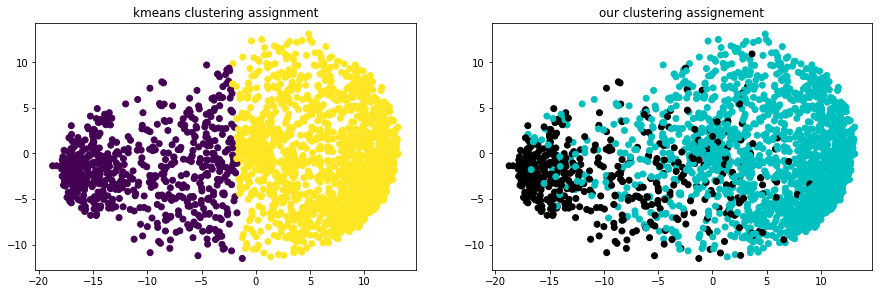

Threshold = 0.5714285714285714
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1 connected components


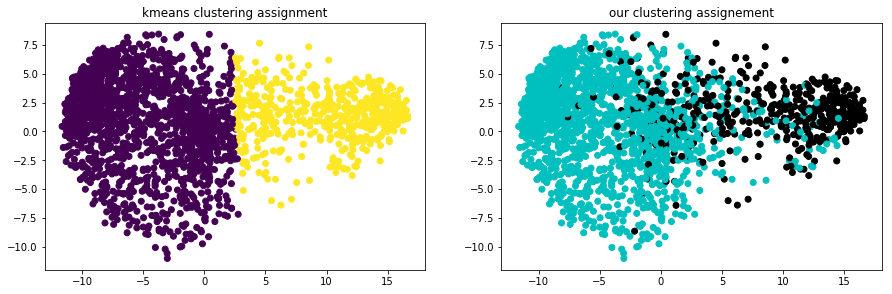

Threshold = 0.6428571428571428
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 3 connected components


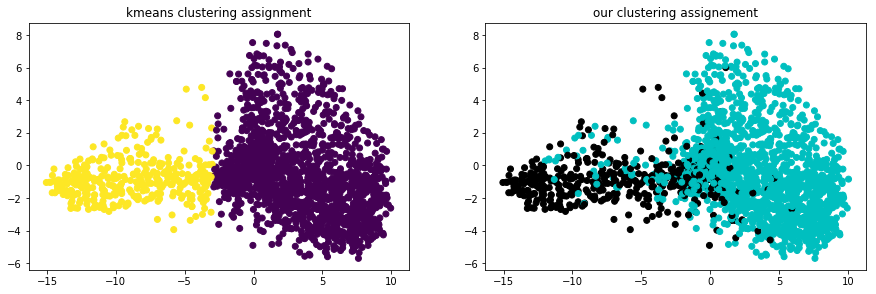

Threshold = 0.7142857142857142
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 54 connected components


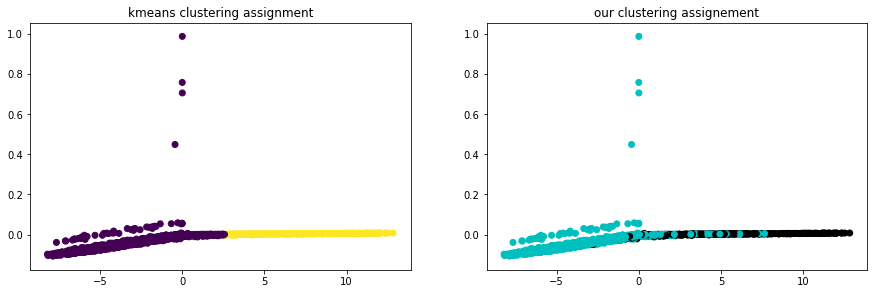

Threshold = 0.7857142857142857
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 279 connected components


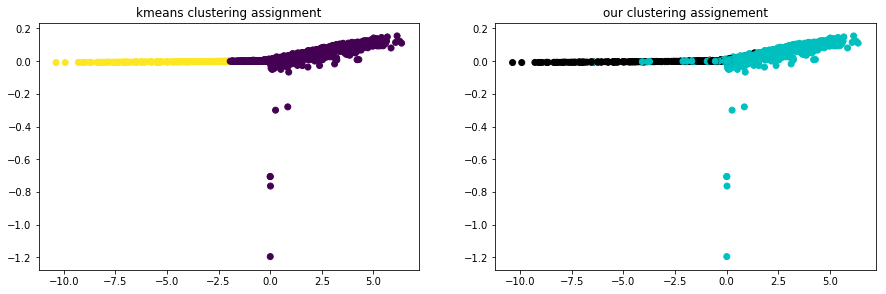

Threshold = 0.8571428571428571
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 780 connected components


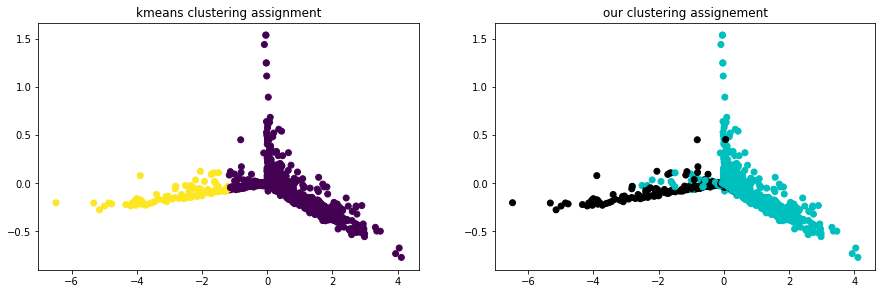

Threshold = 0.9285714285714285
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 1629 connected components


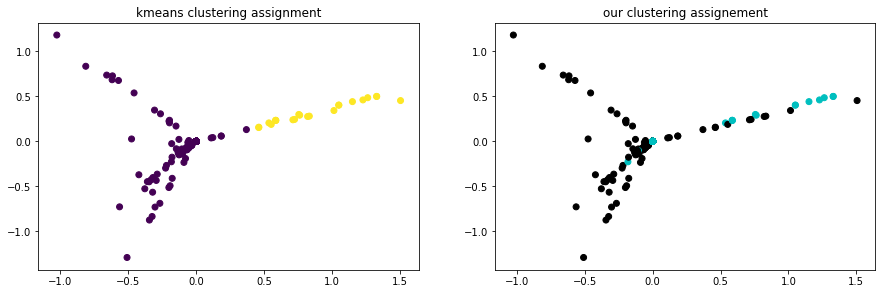

Threshold = 1.0
new sample with shape (2259, 140) created + (2259,) labels
we have 1768 rock songs and 491 hip-hop songs
There are 2254 connected components


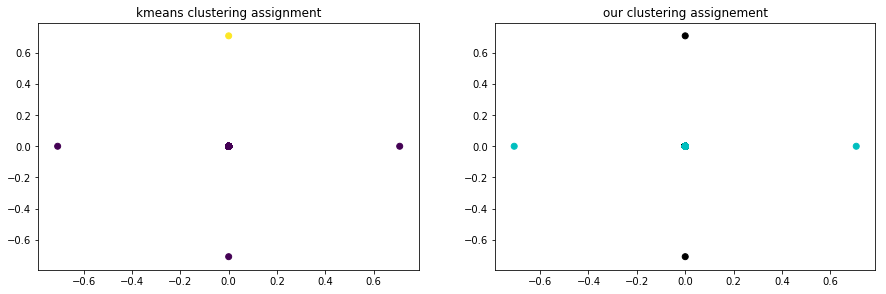

In [26]:
for t in np.linspace(0,1,15):
    binary_precision(sample, [indices[3]], t)

### the results are pretty nice for binary adjacency, the more components we have, the more wtf the plots are

# Should we take 50-50 rock and hip-hop song?

In [27]:
sample = features_and_tracks.sample(n=2000)
np.shape(sample)

(2000, 526)

In [28]:
#check how many rock and hiphop song we have when sampling at random
def ratio_sample(df):
    genres = df['genre_top']
    rock = collections.Counter(genres)['Rock']
    hiphop = collections.Counter(genres)['Hip-Hop']
    ratio = hiphop/rock
    print('we have {} rock songs and {} hip-hop songs. our ratio = {}'.format(rock, hiphop, round(ratio, 2)))

In [29]:
#it is not really equilibrated
ratio_sample(sample)

we have 1559 rock songs and 441 hip-hop songs. our ratio = 0.28


In [30]:
ratio_sample(features_and_tracks)

we have 11127 rock songs and 2992 hip-hop songs. our ratio = 0.27


In [31]:
#we divide the dataframe in two with respect to genre
rock_df = features_and_tracks[features_and_tracks['genre_top']=='Rock']
hiphop_df = features_and_tracks[features_and_tracks['genre_top'] == 'Hip-Hop']
print(np.shape(rock_df), np.shape(hiphop_df))

(11127, 526) (2992, 526)


In [32]:
#now sample from both dataframes
rock_sample = rock_df.sample(n=1000)
hiphop_sample = hiphop_df.sample(n=1000)

In [33]:
equilibrate_sample = pd.concat([rock_sample, hiphop_sample])

In [34]:
#we get a 50-50 sample
ratio_sample(equilibrate_sample)

we have 1000 rock songs and 1000 hip-hop songs. our ratio = 1.0


new sample with shape (2000, 140) created + (2000,) labels


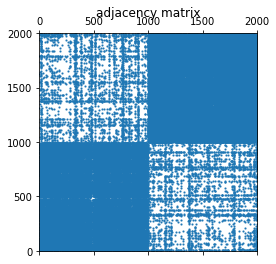

In [35]:
equ_df, equ_labels = select_features(equilibrate_sample, indices[3])
equ_adj = compute_adjacency(equ_df)
binary_equ_adj = binary_adjacency(equ_adj, 0.8)
plot_adjacency(binary_equ_adj)

# Holly molly!!! We can clearly see 2 boxes since the 50-50 sample is concatenate in one sample in correct order (the 1000 first song are from the same genre, so are the 1000 last

### test for que equilibrate sample

new sample with shape (2000, 84) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


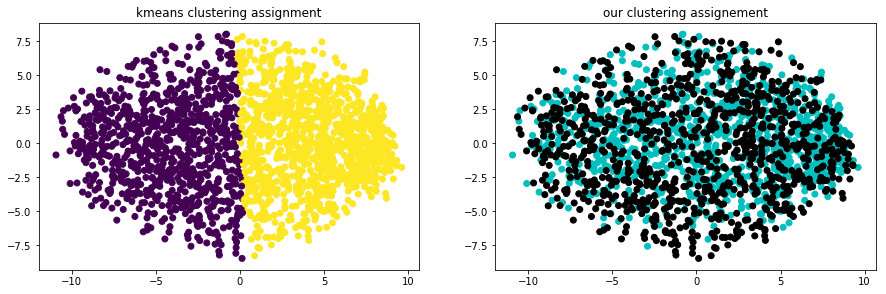

new sample with shape (2000, 84) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


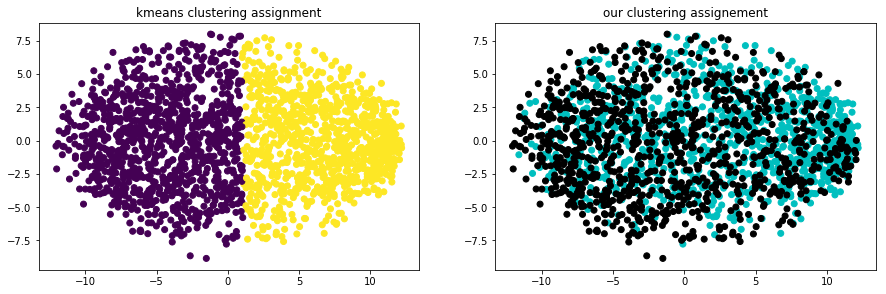

new sample with shape (2000, 84) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


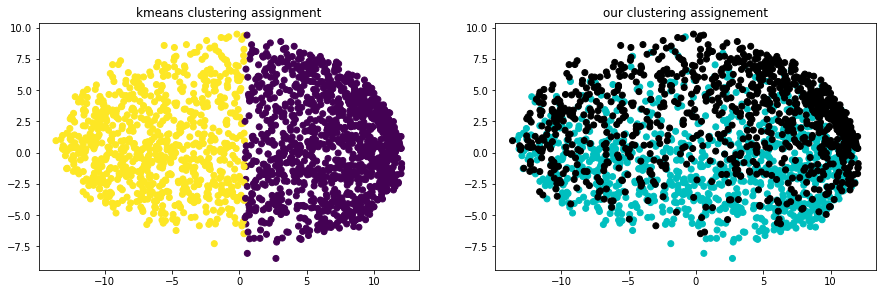

new sample with shape (2000, 140) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


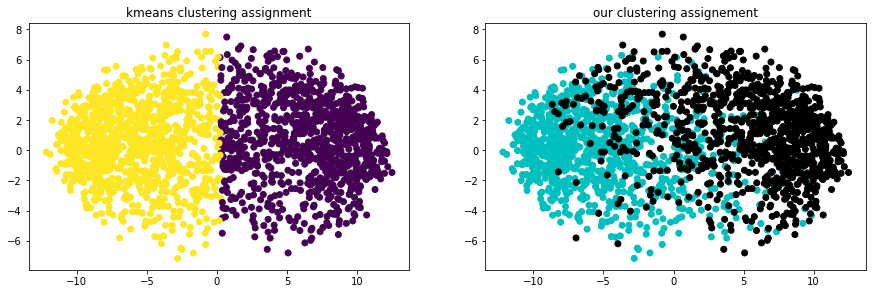

new sample with shape (2000, 7) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


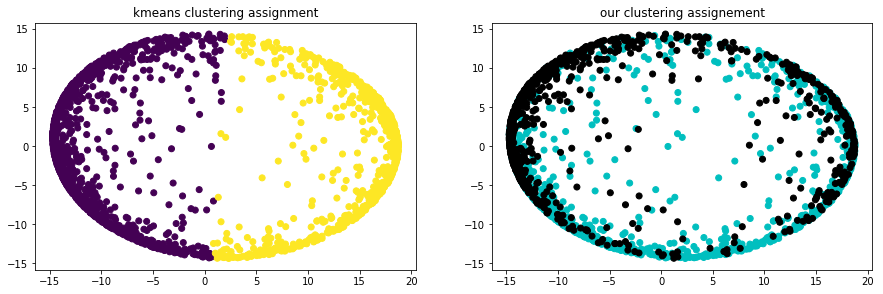

new sample with shape (2000, 7) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


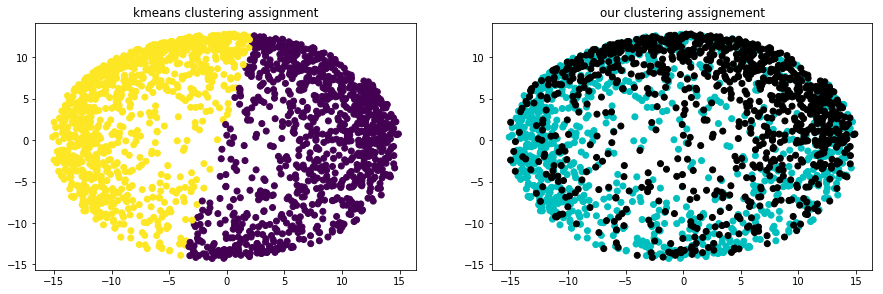

new sample with shape (2000, 7) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


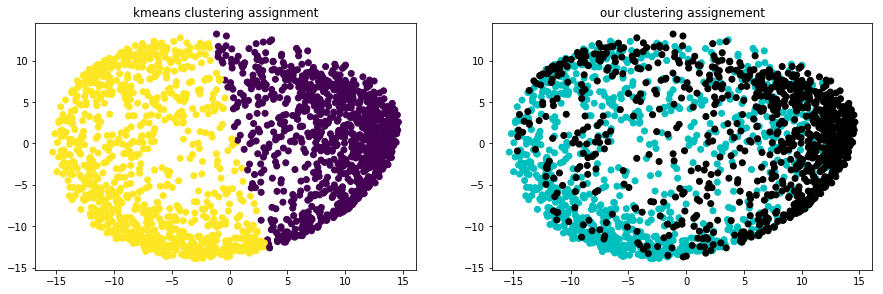

new sample with shape (2000, 49) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


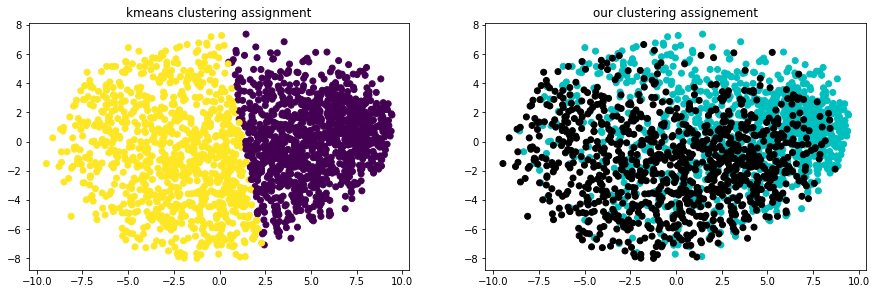

new sample with shape (2000, 7) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


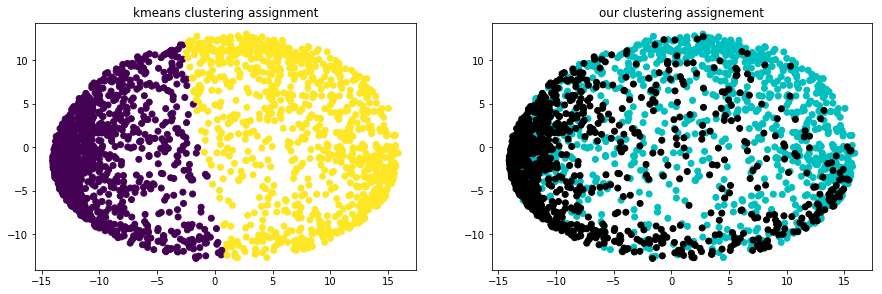

new sample with shape (2000, 42) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


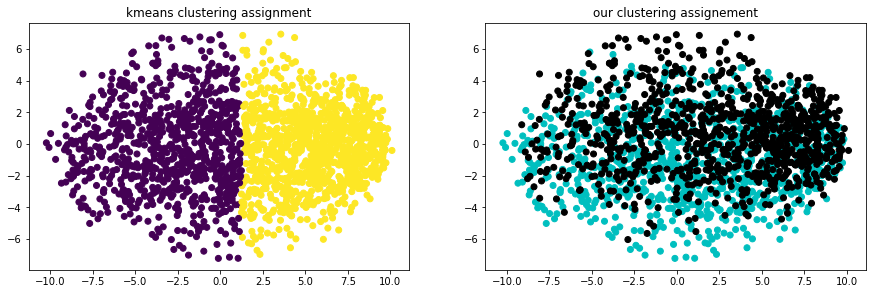

new sample with shape (2000, 7) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


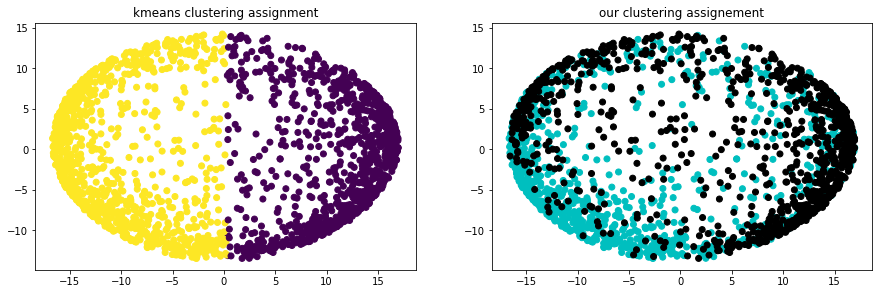

In [36]:
precision(equilibrate_sample, indices)

# For our last test, we use the equilibrate sample with binary matrix (for mfcc)

Threshold = 0.0
new sample with shape (2000, 140) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


C:\Users\patrik\AppData\Local\conda\conda\envs\ntds_2018\lib\site-packages\sklearn\cluster\k_means_.py:968: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return_n_iter=True)


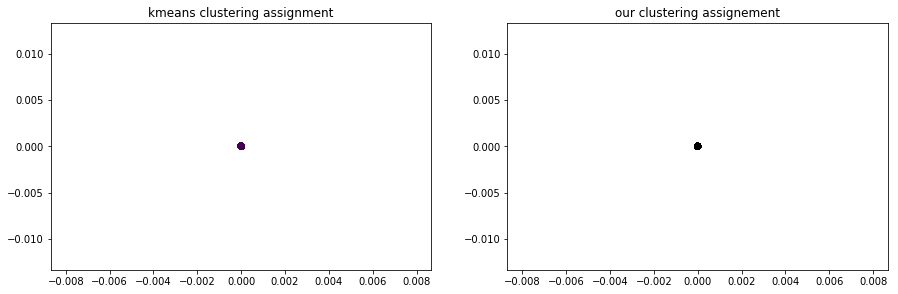

Threshold = 0.1111111111111111
new sample with shape (2000, 140) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


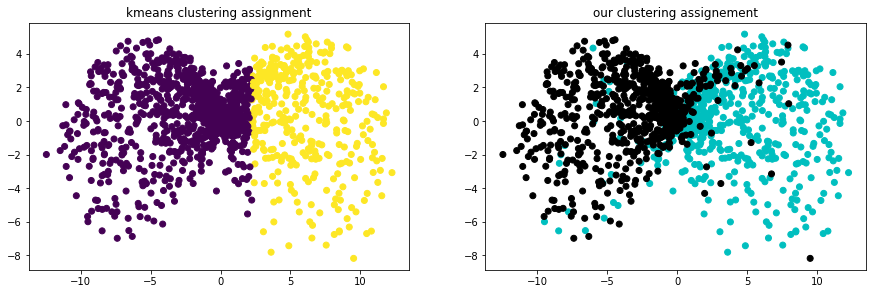

Threshold = 0.2222222222222222
new sample with shape (2000, 140) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


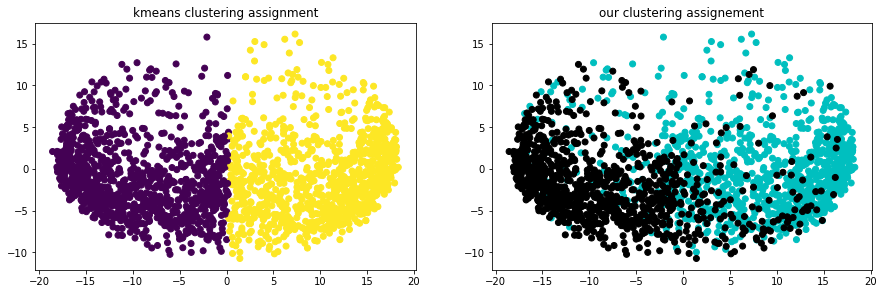

Threshold = 0.3333333333333333
new sample with shape (2000, 140) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


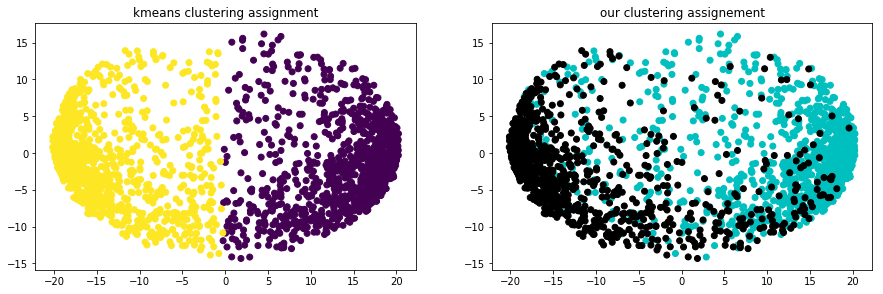

Threshold = 0.4444444444444444
new sample with shape (2000, 140) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


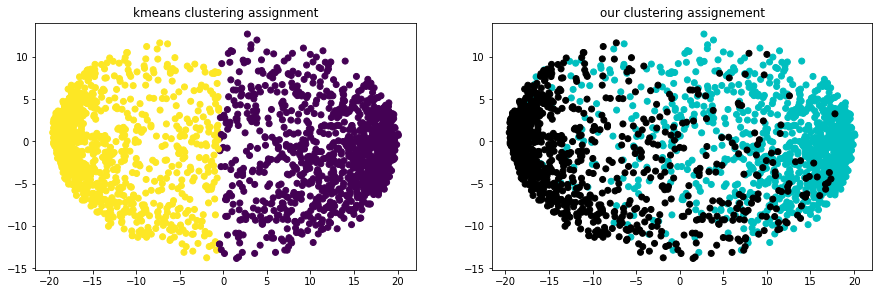

Threshold = 0.5555555555555556
new sample with shape (2000, 140) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1 connected components


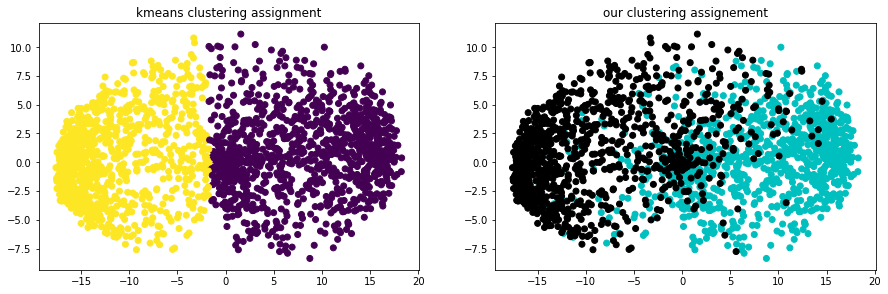

Threshold = 0.6666666666666666
new sample with shape (2000, 140) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 6 connected components


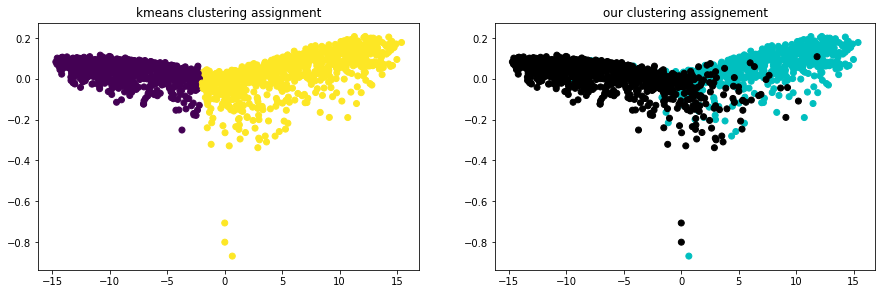

Threshold = 0.7777777777777777
new sample with shape (2000, 140) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 184 connected components


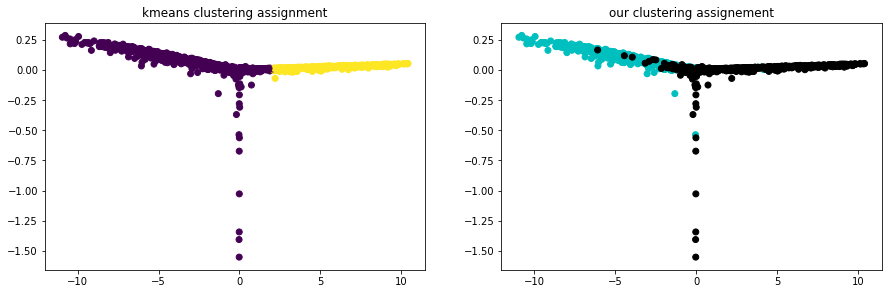

Threshold = 0.8888888888888888
new sample with shape (2000, 140) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 956 connected components


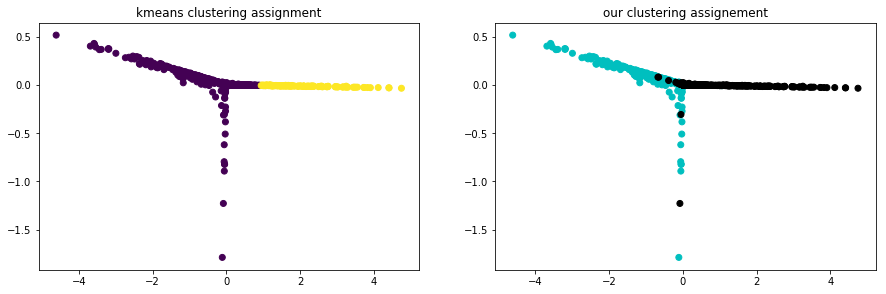

Threshold = 1.0
new sample with shape (2000, 140) created + (2000,) labels
we have 1000 rock songs and 1000 hip-hop songs
There are 1996 connected components


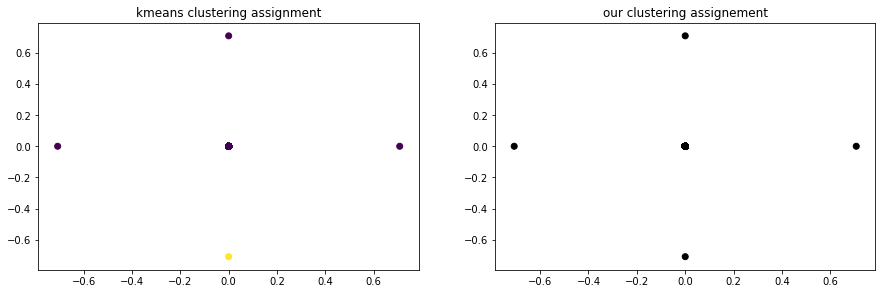

In [37]:
for t in np.linspace(0,1,10):
    binary_precision(equilibrate_sample, [indices[3]], t)

# Save the adjacency and the labels

### After all these test, we have a better overview of which features to take. If binary adjacency matrix, we know which threshold is better. Also we have seen the difference between 50-50 sample or not. I think for now, that our best features are the mfcc only (~140 columns). We can also take a combination of 2 best feature range (we have some nice plots). I'm not sure if binary or not (I'm also not sure if we should take a 50-50 sample).

In [38]:
best_df, best_labels = select_features(equilibrate_sample, indices[3]) #50-50 sample and mfcc features
best_adjacency = compute_adjacency(best_df)

new sample with shape (2000, 140) created + (2000,) labels


In [39]:
np.save('patrik_adjacency', best_adjacency)
np.save('patrik_labels', best_labels)